In [1]:
!pip install lpips torchmetrics
import os

# Upload your kaggle.json before running this if not already there
if not os.path.exists('/root/.kaggle/kaggle.json'):
    from google.colab import files
    files.upload()
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d philiphofmann/o-haze
!unzip -q o-haze.zip -d ohaze_data

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 28.5 MB/s eta 0:00:00


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/philiphofmann/o-haze
License(s): unknown
 95% 520M/547M [00:01<00:00, 352MB/s]
100% 547M/547M [00:01<00:00, 428MB/s]


In [2]:
import torch
import torch.nn as nn

class PALayer(nn.Module):
    def __init__(self, channel, mid_channel=None):
        super(PALayer, self).__init__()
        if mid_channel is None: mid_channel = channel // 8
        self.pa = nn.Sequential(
            nn.Conv2d(channel, mid_channel, 1, padding=0, bias=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channel, 1, 1, padding=0, bias=True),
            nn.Sigmoid()
        )
    def forward(self, x):
        return x * self.pa(x)

class CALayer(nn.Module):
    def __init__(self, channel, mid_channel=None, return_attention=False):
        super(CALayer, self).__init__()
        if mid_channel is None: mid_channel = channel // 8
        self.return_attention = return_attention
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.ca = nn.Sequential(
            nn.Conv2d(channel, mid_channel, 1, padding=0, bias=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channel, channel, 1, padding=0, bias=True),
            nn.Sigmoid()
        )
    def forward(self, x):
        y = self.ca(self.avg_pool(x))
        return y if self.return_attention else x * y

class ResLayer(nn.Module):
    def __init__(self, channel):
        super(ResLayer, self).__init__()
        self.conv1 = nn.Conv2d(channel, channel, 1, 1, 0, bias=True)
        self.in1 = nn.InstanceNorm2d(channel, affine=True)
        self.relu = nn.ReLU(inplace=True)
        self.conv4 = nn.Conv2d(channel, channel, 3, 1, 1, bias=True)
        self.in4 = nn.InstanceNorm2d(channel, affine=True)
    def forward(self, x):
        y = self.relu(self.in1(self.conv1(x)))
        y = self.in4(self.conv4(y))
        return self.relu(x + y)

class DehazeNet(nn.Module):
    def __init__(self, gps=3, dim=64):
        super(DehazeNet, self).__init__()
        self.gps, self.dim = gps, dim
        self.conv1 = nn.Conv2d(3, 32, 3, 1, 1)
        self.in1 = nn.InstanceNorm2d(32, affine=True)
        self.conv2 = nn.Conv2d(32, dim, 3, 1, 1)
        self.in2 = nn.InstanceNorm2d(dim, affine=True)
        self.relu = nn.ReLU(inplace=True)
        self.res_layers = nn.ModuleList([ResLayer(dim) for _ in range(7)])
        self.ca = CALayer(dim * gps, mid_channel=dim // 16, return_attention=True)
        self.pa = PALayer(dim)
        self.conv3 = nn.Conv2d(dim, 32, 3, 1, 1)
        self.in3 = nn.InstanceNorm2d(32, affine=True)
        self.conv4 = nn.Conv2d(32, 3, 3, 1, 1)

    def forward(self, x):
        y = self.relu(self.in1(self.conv1(x)))
        y1 = self.relu(self.in2(self.conv2(y)))
        y = y1
        res_outs = []
        for i, layer in enumerate(self.res_layers):
            y = layer(y)
            if i == 3 or i == 6: res_outs.append(y)

        feat = torch.cat([y1, res_outs[0], res_outs[1]], dim=1)
        w = self.ca(feat).view(-1, self.gps, self.dim)[:, :, :, None, None]
        y = w[:, 0] * y1 + w[:, 1] * res_outs[0] + w[:, 2] * res_outs[1]
        y = self.pa(y)
        y = self.relu(self.in3(self.conv3(y)))
        y = self.conv4(y)
        return self.relu(x + y)

In [3]:
import glob
import cv2
import numpy as np
from torch.utils.data import Dataset, DataLoader, random_split

class OHazeDataset(Dataset):
    def __init__(self, root_dir, size=256):
        self.hazy_images = sorted(glob.glob("/content/ohaze_data/**/hazy/*.jpg", recursive=True))
        self.gt_images = sorted(glob.glob("/content/ohaze_data/**/GT/*.jpg", recursive=True))
        self.size = size

    def __len__(self):
        return len(self.hazy_images)

    def __getitem__(self, idx):
        haze = cv2.cvtColor(cv2.imread(self.hazy_images[idx]), cv2.COLOR_BGR2RGB)
        gt = cv2.cvtColor(cv2.imread(self.gt_images[idx]), cv2.COLOR_BGR2RGB)

        haze = cv2.resize(haze, (self.size, self.size)) / 255.0
        gt = cv2.resize(gt, (self.size, self.size)) / 255.0

        haze = torch.from_numpy(haze).float().permute(2, 0, 1)
        gt = torch.from_numpy(gt).float().permute(2, 0, 1)
        return haze, gt

dataset = OHazeDataset("ohaze_data")
train_size = int(0.7 * len(dataset))
val_size = int(0.15 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_db, val_db, test_db = random_split(dataset, [train_size, val_size, test_size])

train_loader = DataLoader(train_db, batch_size=4, shuffle=True)
val_loader = DataLoader(val_db, batch_size=1, shuffle=False)
test_loader = DataLoader(test_db, batch_size=1, shuffle=False)

In [5]:
def train_model(epochs=10):
    model.train()
    print(f"Starting training on {device}...")
    for epoch in range(epochs):
        avg_loss = 0
        for haze, gt in train_loader:
            haze, gt = haze.to(device), gt.to(device)
            optimizer.zero_grad()

            # Use the newer amp API if possible, or stick to your current one:
            with torch.cuda.amp.autocast():
                pred = model(haze)
                loss = criterion(pred, gt)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            avg_loss += loss.item()

        # CHANGED: Print every epoch so you can see progress
        print(f"Epoch [{epoch+1}/{epochs}] - Average L1 Loss: {avg_loss/len(train_loader):.6f}")

train_model(epochs=10)

Starting training on cuda...


/tmp/ipython-input-59814699.py:11: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch [1/10] - Average L1 Loss: 0.129008
Epoch [2/10] - Average L1 Loss: 0.186045
Epoch [3/10] - Average L1 Loss: 0.202379
Epoch [4/10] - Average L1 Loss: 0.208463
Epoch [5/10] - Average L1 Loss: 0.216212
Epoch [6/10] - Average L1 Loss: 0.211334
Epoch [7/10] - Average L1 Loss: 0.215623
Epoch [8/10] - Average L1 Loss: 0.213159
Epoch [9/10] - Average L1 Loss: 0.213598
Epoch [10/10] - Average L1 Loss: 0.209870



 PERFORMANCE METRICS: TRAINING SET
MSE:   0.068298
PSNR:  11.7190
SSIM:  0.4966
LPIPS: 0.4773


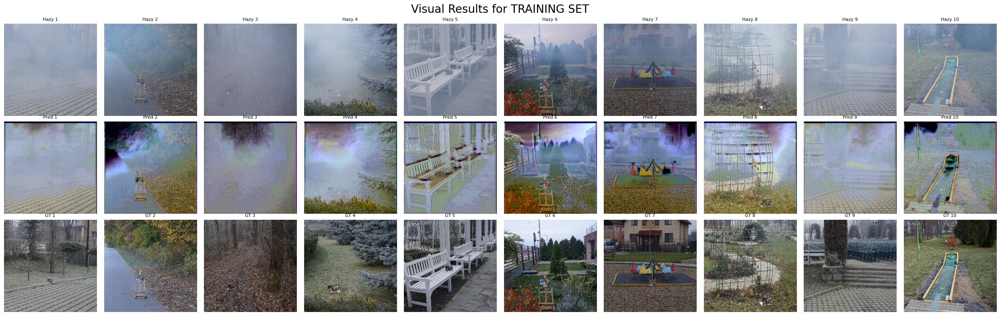


 PERFORMANCE METRICS: VALIDATION SET
MSE:   0.076383
PSNR:  11.3047
SSIM:  0.4956
LPIPS: 0.4975


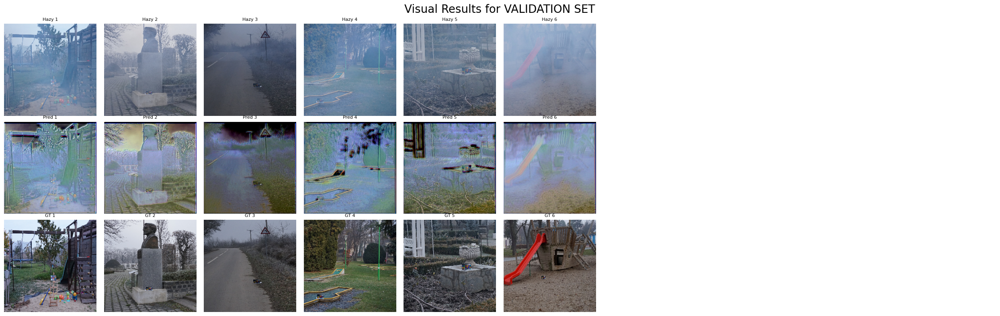


 PERFORMANCE METRICS: TESTING SET
MSE:   0.061707
PSNR:  12.2080
SSIM:  0.5358
LPIPS: 0.4483


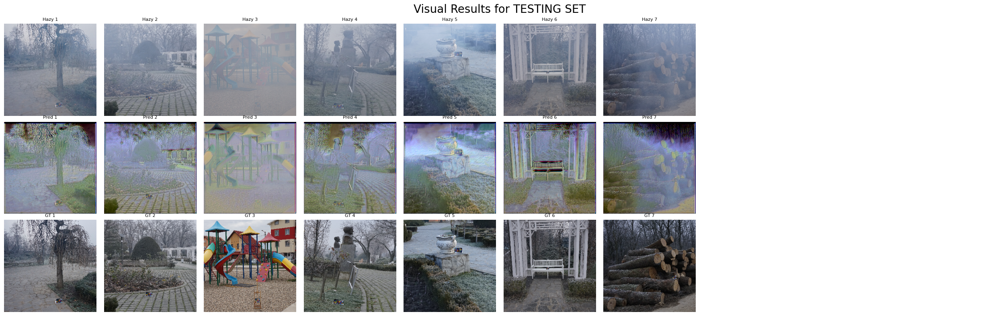

In [10]:
import matplotlib.pyplot as plt
import torch
import numpy as np

# This is the most compatible import path across torchmetrics versions
import torchmetrics.functional as metrics

def evaluate_and_visualize(loader, name="Dataset"):
    model.eval()
    mse_total, psnr_total, ssim_total, lpips_total = 0, 0, 0, 0
    samples = []

    with torch.no_grad():
        for haze, gt in loader:
            haze, gt = haze.to(device), gt.to(device)
            pred = model(haze)
            pred = torch.clamp(pred, 0, 1)

            # Metric Calculations
            mse_total += torch.mean((pred - gt)**2).item()

            # Using the direct functional calls which are most stable
            psnr_total += metrics.peak_signal_noise_ratio(pred, gt, data_range=1.0).item()
            ssim_total += metrics.structural_similarity_index_measure(pred, gt, data_range=1.0).item()

            # LPIPS calculation (handling the batch mean)
            lpips_val = lpips_fn(pred * 2 - 1, gt * 2 - 1).mean().item()
            lpips_total += lpips_val

            # Collect up to 10 samples for the grid
            if len(samples) < 10:
                for j in range(haze.size(0)):
                    if len(samples) < 10:
                        samples.append((haze[j].cpu(), pred[j].cpu(), gt[j].cpu()))

    num_batches = len(loader)
    print(f"\n{'='*30}")
    print(f" PERFORMANCE METRICS: {name}")
    print(f"{'='*30}")
    print(f"MSE:   {mse_total/num_batches:.6f}")
    print(f"PSNR:  {psnr_total/num_batches:.4f}")
    print(f"SSIM:  {ssim_total/num_batches:.4f}")
    print(f"LPIPS: {lpips_total/num_batches:.4f}")

    # Create the 3x10 Grid
    fig, axes = plt.subplots(3, 10, figsize=(25, 8))
    for i in range(10):
        if i < len(samples):
            # Row 0: Hazy
            axes[0, i].imshow(samples[i][0].permute(1, 2, 0).numpy())
            axes[0, i].set_title(f"Hazy {i+1}", fontsize=8)

            # Row 1: Prediction
            axes[1, i].imshow(samples[i][1].permute(1, 2, 0).numpy())
            axes[1, i].set_title(f"Pred {i+1}", fontsize=8)

            # Row 2: Ground Truth
            axes[2, i].imshow(samples[i][2].permute(1, 2, 0).numpy())
            axes[2, i].set_title(f"GT {i+1}", fontsize=8)

        for row in range(3):
            axes[row, i].axis('off')

    plt.suptitle(f"Visual Results for {name}", fontsize=20)
    plt.tight_layout()
    plt.show()

# Run for all three splits
evaluate_and_visualize(train_loader, "TRAINING SET")
evaluate_and_visualize(val_loader, "VALIDATION SET")
evaluate_and_visualize(test_loader, "TESTING SET")